In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


class TrafficSignDetector:
    def __init__(self, images_dir, train_images_dir):
        """
        Initialize the TrafficSignDetector with directories for images.

        :param images_dir: Path to the root image directory
        :param train_images_dir: Path to the training images subdirectory
        """
        self.images_dir = images_dir
        self.train_images_dir = train_images_dir

        # Placeholder for image dimensions and processing steps
        self.height = None
        self.width = None
        self.gray_image = None
        self.histofram_eq_image = None
        self.blurred_image = None
        self.thresholded_image = None
        self.edges = None
        self.eroded_image = None
        self.filtered_components = None
        self.output_image = None
        self.circles = None
        self.detected_plates = []

    def process_image(self, image_name):
        """
        Process an image through the detection pipeline.
        
        :param image_name: Filename of the image to process
        """
        # 1. Load and convert to grayscale
        image_path = os.path.join(self.images_dir, self.train_images_dir, image_name)
        self.gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        self.height, self.width = self.gray_image.shape
        

        # 2. Gaussian blur
        kernel_size = (self.width // 40, self.height // 40)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0] | 1), max(3, kernel_size[1] | 1))  # Ensure odd size
        self.blurred_image = cv2.GaussianBlur(self.gray_image, kernel_size, 0.)

        

        # 3. Thresholding
        self.thresholded_image = cv2.adaptiveThreshold(
                self.blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                cv2.THRESH_BINARY,
                19, 2
                )

        
        # 4. Edge detection

        #make self.edges the negatice of the self.thresholded_image
        self.edges = cv2.bitwise_not(self.thresholded_image)
        
        
        # Connected components analysis
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(self.edges, 8, cv2.CV_32S)
        self.connected_component_image = labels.copy()
        self.filtered_components = np.zeros(self.edges.shape, dtype=np.uint8)



        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] > 1000 and 0.5 < stats[i, cv2.CC_STAT_WIDTH] / stats[i, cv2.CC_STAT_HEIGHT] < 2:
                # Extract the mask of the current component
                component_mask = (labels == i).astype(np.uint8)
                # Calculate moments
                moments = cv2.moments(component_mask)
                if moments["mu20"] + moments["mu02"] == 0:  # Avoid division by zero
                    continue
                # Calculate covariance matrix eigenvalues
                covariance_matrix = np.array([
                    [moments["mu20"], moments["mu11"]],
                    [moments["mu11"], moments["mu02"]]
                ])
                eigenvalues, _ = np.linalg.eig(covariance_matrix)
                eigenvalues = sorted(eigenvalues, reverse=True)  # Sort eigenvalues
                # Calculate eccentricity
                if eigenvalues[0] == 0:
                    eccentricity = 0
                else:
                    eccentricity = np.sqrt(1 - (eigenvalues[1] / eigenvalues[0]))
                print("eccentricity", eccentricity)
                
                # Check if eccentricity is less than 0.9
                if eccentricity < 0.8:
                    self.filtered_components[labels == i] = 255

        # 5. Morphological operations
        kernel_size = (self.width // 100, self.height // 100)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0]), max(3, kernel_size[1]))  # Ensure minimum size
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
        dilated_image =   cv2.dilate(self.filtered_components, kernel, iterations=1)
        self.eroded_image = cv2.erode(dilated_image, kernel, iterations=1)


        # 6. Circle detection (Hough Transform)
        min_radius = min(self.height // 40, self.width // 40)  # Relative to image height
        print(min_radius)
        max_radius = max(self.height // 2, self.width // 2)
        self.circles = cv2.HoughCircles(
            self.eroded_image,
            cv2.HOUGH_GRADIENT_ALT,
            dp=1,
            minDist=min(self.height // 20, self.width // 20),
            param1=20,
            param2=0.5,
            minRadius=min_radius,
            maxRadius=max_radius,
        )

        # 7. Remove overlapping circles
        self.remove_overlapping_circles()

        # 8. Draw detected circles and extract plates
        self.output_image = cv2.cvtColor(self.gray_image, cv2.COLOR_GRAY2BGR)
        if self.circles is not None:
            self.circles = np.uint16(np.around(self.circles))
            for circle in self.circles[0, :]:
                x, y, r = circle
                cv2.circle(self.output_image, (x, y), r, (0, 255, 0), 2)
                cropped_plate = self.gray_image[max(0, y - r) : min(self.height, y + r), max(0, x - r) : min(self.width, x + r)]
                self.detected_plates.append(cropped_plate)

    def remove_overlapping_circles(self, overlap_threshold=0.3):
        """
        Remove overlapping circles from the list based on a threshold.

        :param overlap_threshold: The minimum overlap ratio to consider two circles as overlapping
        """
        if self.circles is not None:
            valid_circles = []
            for i, circle1 in enumerate(self.circles[0, :]):
                x1, y1, r1 = circle1
                is_overlapping = False
                
                # If valid_circles is empty, we can add the first circle directly
                if len(valid_circles) == 0:
                    valid_circles.append(circle1)
                    continue
                
                for circle2 in valid_circles:
                    x2, y2, r2 = circle2
                    # Calculate distance between centers
                    distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
                    print(x1, y1, r1, x2, y2, r2, distance)
                    # Check if the circles overlap more than the threshold
                    print(distance, (r1 + r2) * (1 - overlap_threshold))
                    if distance < (r1 + r2) * (1 - overlap_threshold):
                        is_overlapping = True
                        break

                if not is_overlapping:
                    valid_circles.append(circle1)
            
            # Update self.circles with the filtered non-overlapping circles
            self.circles = np.array([valid_circles], dtype=np.uint16)


    def visualize_results(self):
        """
        Visualize intermediate results and detected plates.
        """
        titles = [
            "Original Image",
            "Gaussian Blur",
            "Thresholded Image",
            "Edges",
            "Connected Components",
            "Filtered Components",
            "Morphological Image",
            "Detected Circles",
        ]
        images = [
            self.gray_image,
            self.blurred_image,
            self.thresholded_image,
            self.edges,
            self.connected_component_image,
            self.filtered_components ,
            self.eroded_image,
            self.output_image,
        ]

        plt.figure(figsize=(20, 10))
        for i, (title, img) in enumerate(zip(titles, images), 1):
            if img is not None:
                plt.subplot(2, 4, i)
                plt.title(title)
                cmap = "gray" if len(img.shape) == 2 else None
                plt.imshow(img, cmap=cmap)
                #plt.axis("off")

        # Visualize detected plates
        for i, plate in enumerate(self.detected_plates, 1):
            plt.figure(figsize=(5, 5))
            plt.title(f"Detected Plate {i}")
            plt.imshow(plate, cmap="gray")
            #plt.axis("off")
            plt.show()

        plt.tight_layout()
        plt.show()


libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


eccentricity 0.9412133190128059
eccentricity 0.8624209350482912
eccentricity 0.979870296428832
eccentricity 0.7100313655650019
eccentricity 0.9585767631723722
eccentricity 0.8211338796603275
eccentricity 0.9719295379032991
eccentricity 0.9896183163148725
eccentricity 0.9762355553263885
eccentricity 0.8729902652225396
eccentricity 0.591441315864207
eccentricity 0.7633812937510999
eccentricity 0.8069221484878876
eccentricity 0.9916300404732823
eccentricity 0.9920940983817541
eccentricity 0.8352522309858428
eccentricity 0.9024010928501199
eccentricity 0.6180432714184126
eccentricity 0.9985805427825963
29


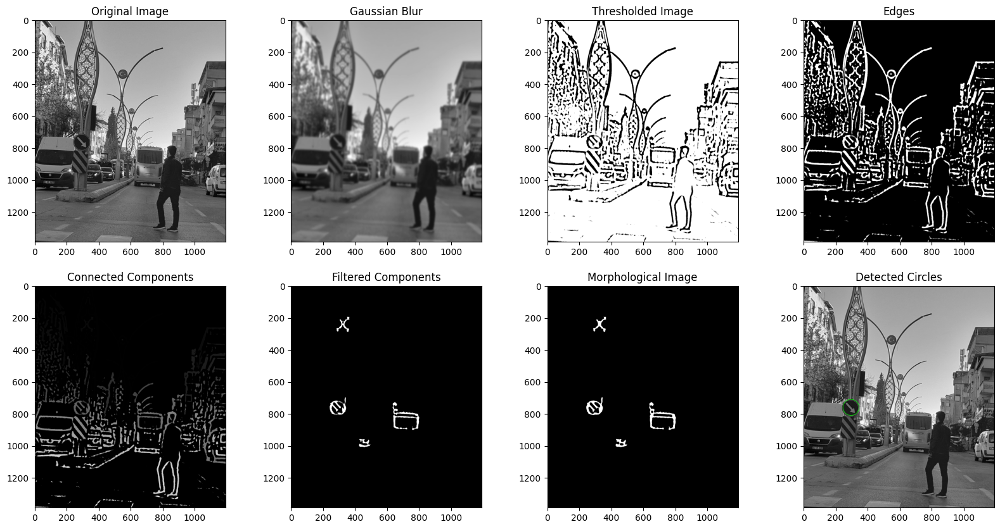

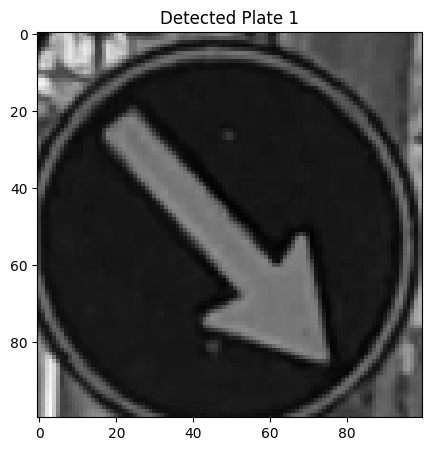

<Figure size 640x480 with 0 Axes>

In [19]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_hard_3.png")
detector.visualize_results()

eccentricity 0.13694846916537504
eccentricity 0.643919200104109
4
75.0 82.0 50.049713 88.0 76.0 50.339348 14.3178215
14.3178215 70.27234


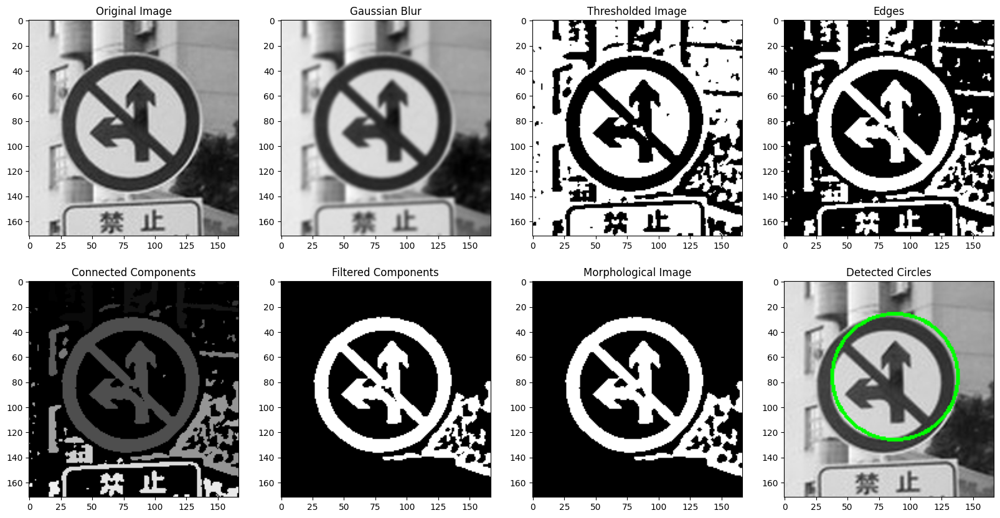

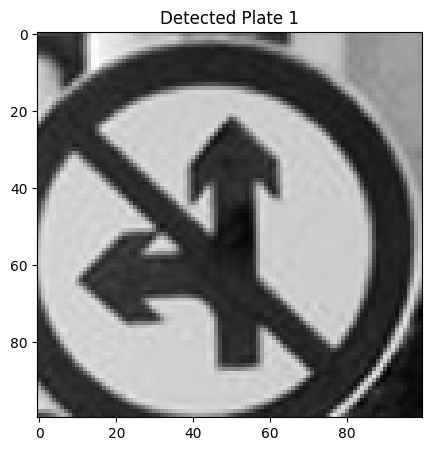

<Figure size 640x480 with 0 Axes>

In [20]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_2.png")
detector.visualize_results()

eccentricity 0.8269776500601527
eccentricity 0.09875922753611355
eccentricity 0.8424540990386181
3
77.0 69.0 37.435284 77.0 69.0 45.305264 0.0
0.0 57.91838


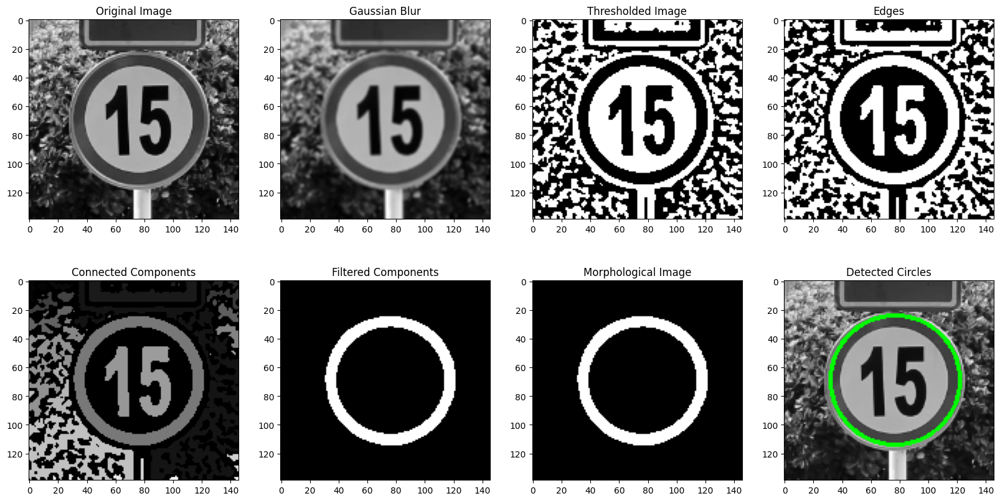

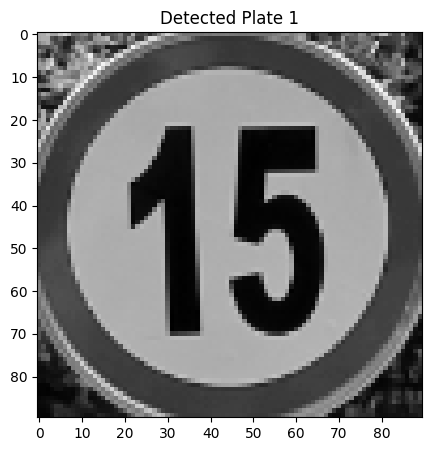

<Figure size 640x480 with 0 Axes>

In [21]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


eccentricity 0.2444171865177293
eccentricity 0.14800208747637078
eccentricity 0.26446405723044386
eccentricity 0.8845095315550157
eccentricity 0.7923430565718844
eccentricity 0.5979695689213019
eccentricity 0.9811218346516368
eccentricity 0.9901913701391237
eccentricity 0.9980756838627729
eccentricity 0.9989815351500482
21
435.0 277.0 195.71799 435.0 277.0 226.42853 0.0
0.0 295.50256


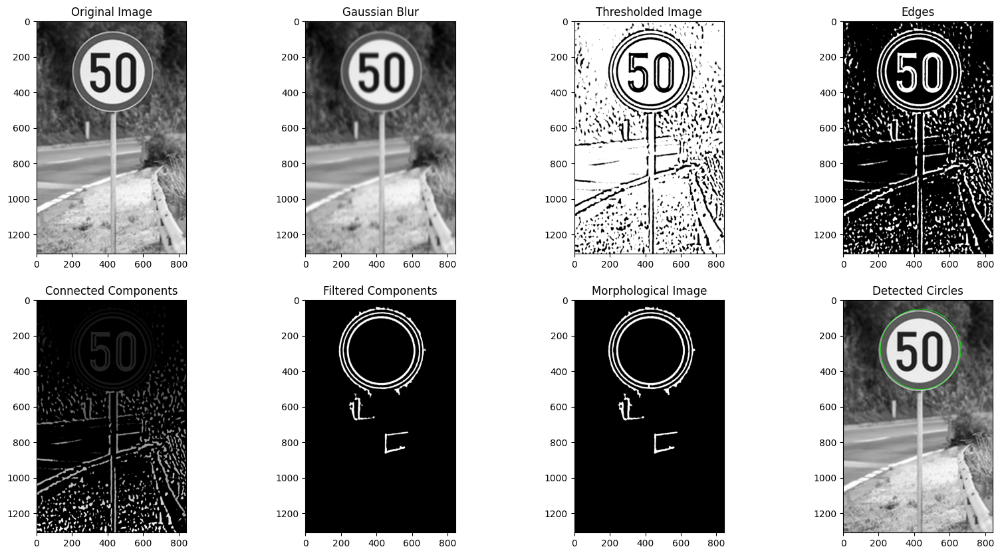

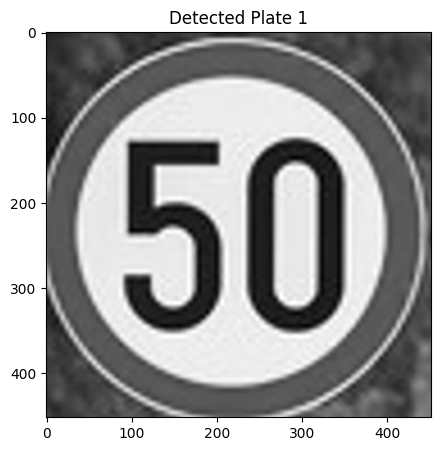

<Figure size 640x480 with 0 Axes>

In [22]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_middle_1.png")
detector.visualize_results()

eccentricity 0.7382410198865413
eccentricity 0.6272218717110009
8
172.0 109.0 74.17331 164.0 142.0 87.1891 33.955853
33.955853 112.95369
145.0 137.0 69.95578 164.0 142.0 87.1891 19.646883
19.646883 110.00142
164.0 142.0 54.65321 164.0 142.0 87.1891 0.0
0.0 99.28962
69.0 77.0 21.162516 164.0 142.0 87.1891 115.10864
115.10864 75.84613
172.0 283.0 15.503936 164.0 142.0 87.1891 141.22676
141.22676 71.885124
172.0 283.0 15.503936 69.0 77.0 21.162516 230.315
230.315 25.666515


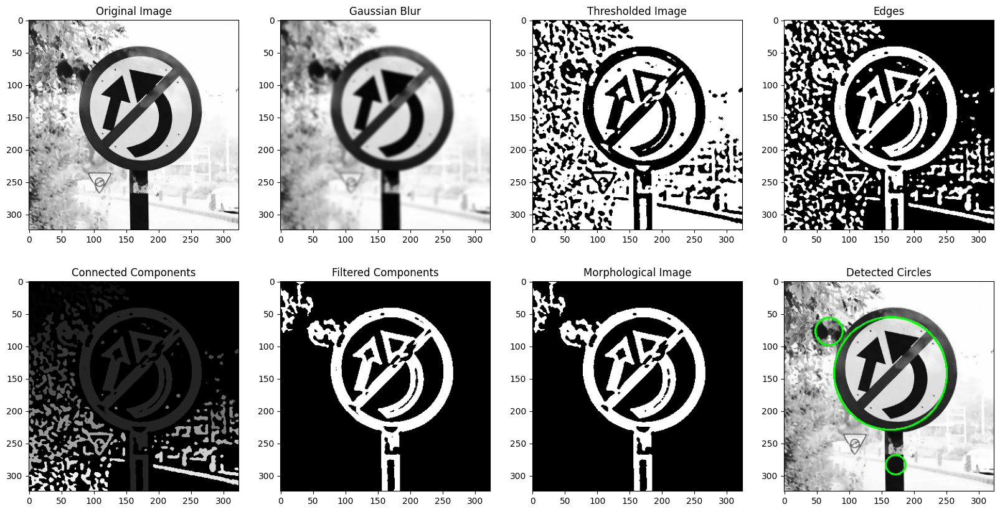

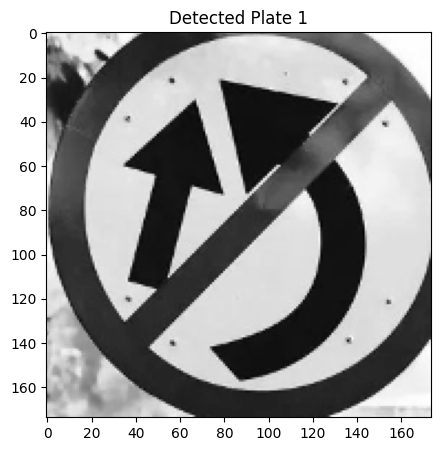

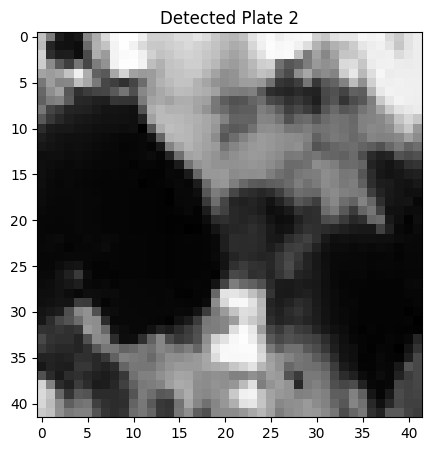

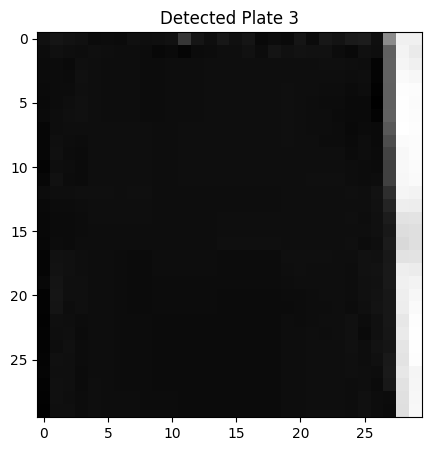

<Figure size 640x480 with 0 Axes>

In [23]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_middle_2.png")
detector.visualize_results()

# Test

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


eccentricity 0.36188585168584225
eccentricity 0.3838369262690731
eccentricity 0.3582461261497466
eccentricity 0.362747157328347
eccentricity 0.8765903180198679
eccentricity 0.537464001572991
eccentricity 0.713857552602164
eccentricity 0.23917664836989647
eccentricity 0.3644811757230969
eccentricity 0.28775006303124034
eccentricity 0.18711450244311317
eccentricity 0.8873195174023637
eccentricity 0.8827723216738453
eccentricity 0.8709296243456239
eccentricity 0.34076027020872984
eccentricity 0.3318853623287869
eccentricity 0.44666041057605604
27
247.0 775.0 219.56854 706.0 295.0 215.6805 664.1393
664.1393 304.67432
736.0 775.0 204.52986 706.0 295.0 215.6805 480.93658
480.93658 294.14725
736.0 775.0 204.52986 247.0 775.0 219.56854 489.0
489.0 296.86887
736.0 775.0 246.77669 706.0 295.0 215.6805 480.93658
480.93658 323.72003
736.0 775.0 246.77669 247.0 775.0 219.56854 489.0
489.0 326.44165
736.0 775.0 246.77669 736.0 775.0 204.52986 0.0
0.0 315.91458
251.0 318.0 211.78914 706.0 295.0 215.6

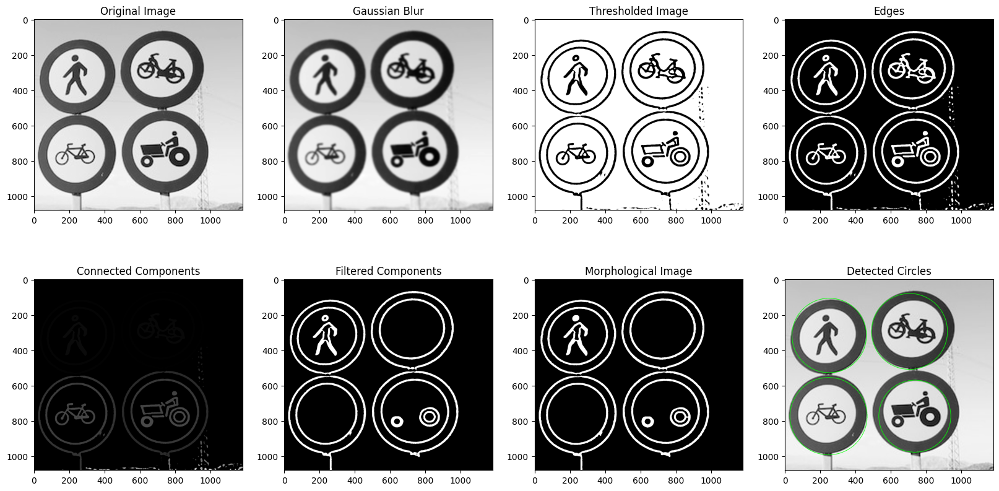

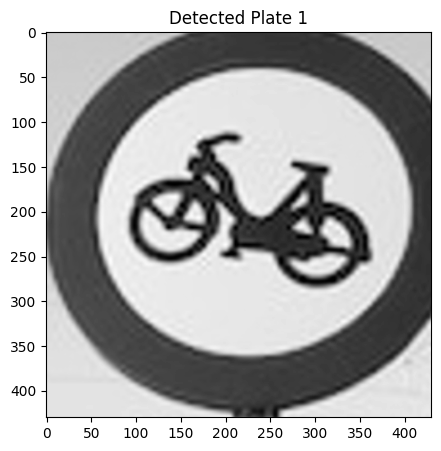

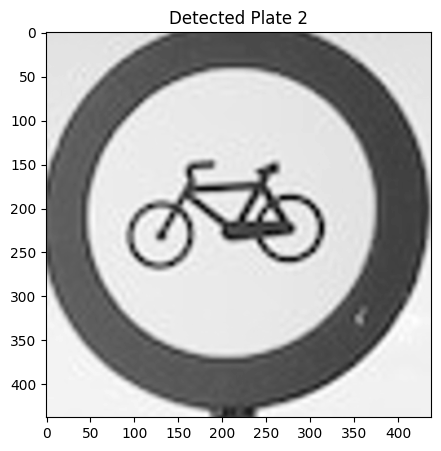

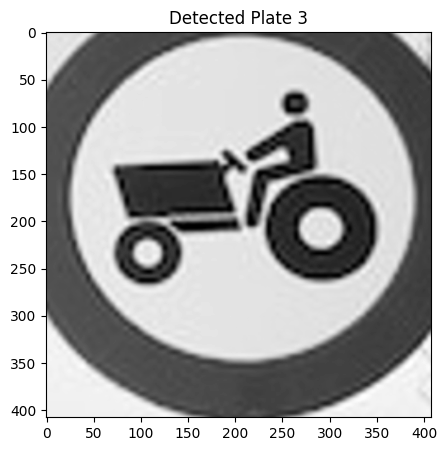

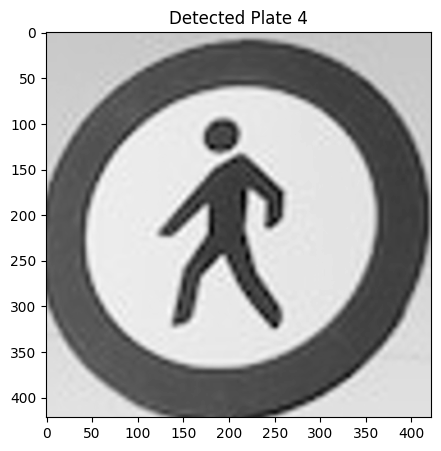

<Figure size 640x480 with 0 Axes>

In [24]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_easy_1.png")
detector.visualize_results()

eccentricity 0.8899576654423415
eccentricity 0.6297098588369047
eccentricity 0.538739721390759
eccentricity 0.4790650995800352
eccentricity 0.8771504411493117
eccentricity 0.27005317047403044
8
188.0 170.0 127.301834 188.0 170.0 148.91168 0.0
0.0 193.34944
197.0 202.0 128.19212 188.0 170.0 148.91168 33.24154
33.24154 193.97267
197.0 202.0 145.46985 188.0 170.0 148.91168 33.24154
33.24154 206.06706
197.0 202.0 163.41093 188.0 170.0 148.91168 33.24154
33.24154 218.62584
119.0 213.0 62.499786 188.0 170.0 148.91168 81.3019
81.3019 147.98802
144.0 92.0 35.410183 188.0 170.0 148.91168 89.55445
89.55445 129.0253
71.0 290.0 16.959213 188.0 170.0 148.91168 167.59773
167.59773 116.10963
305.0 334.0 16.93092 188.0 170.0 148.91168 201.4572
201.4572 116.08982
305.0 334.0 16.93092 71.0 290.0 16.959213 238.10081
238.10081 23.723093


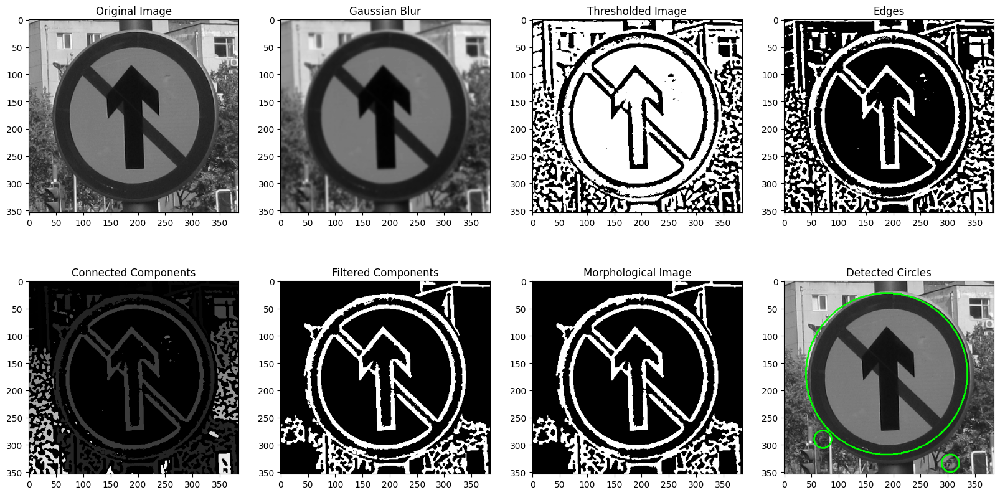

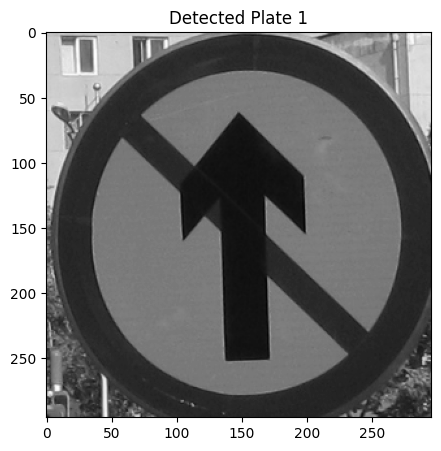

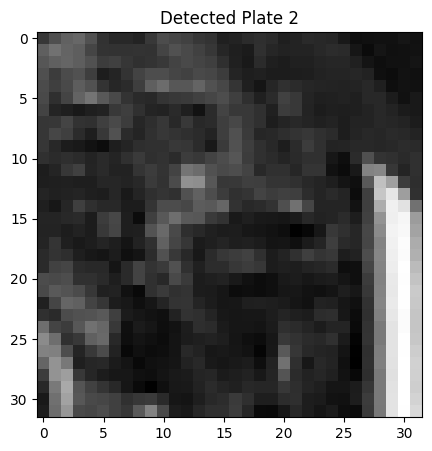

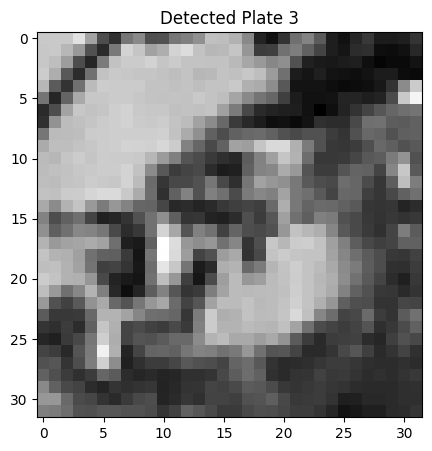

<Figure size 640x480 with 0 Axes>

In [25]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_easy_2.png")
detector.visualize_results()

eccentricity 0.851590287794368
eccentricity 0.9021198528424954
eccentricity 0.6169747981668764
15


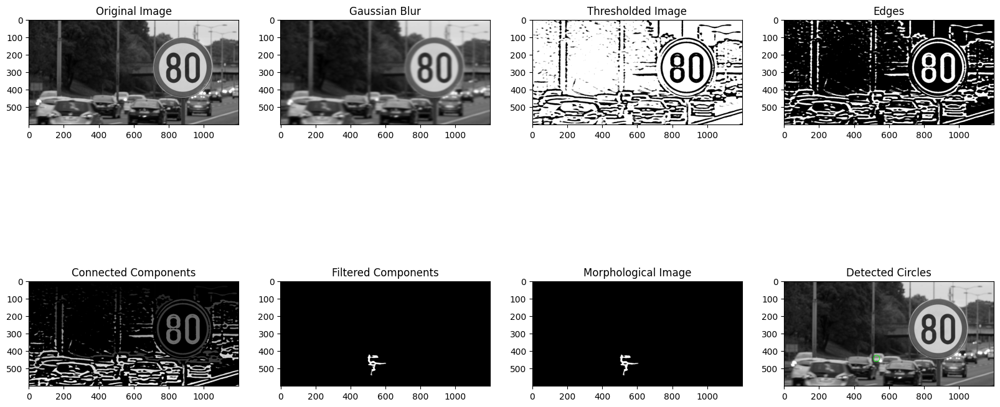

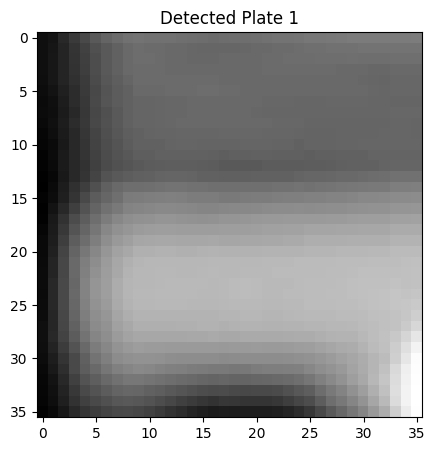

<Figure size 640x480 with 0 Axes>

In [26]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_1.png")
detector.visualize_results()

eccentricity 0.8864844475983339
eccentricity 0.9895743992285541
eccentricity 0.8384325763331305
eccentricity 0.8161821388668961
eccentricity 0.9797220112430055
eccentricity 0.8458856535912656
eccentricity 0.8137326986361352
eccentricity 0.865210687368206
eccentricity 0.9731213384561079
eccentricity 0.7037490859435348
eccentricity 0.9561029157818272
eccentricity 0.6886042342966147
eccentricity 0.4919694760740287
eccentricity 0.8756223740482556
eccentricity 0.8616144899136196
eccentricity 0.8261424418670006
eccentricity 0.812086433139835
eccentricity 0.9515979772991482
eccentricity 0.963609581731533
eccentricity 0.7832587504643075
eccentricity 0.52579755840475
eccentricity 0.9979784016529845
eccentricity 0.9159531981087834
eccentricity 0.9193156876604704
eccentricity 0.9088653915048188
eccentricity 0.6037968777868581
eccentricity 0.8888329505504661
eccentricity 0.9265118232844523
eccentricity 0.8877658411730552
eccentricity 0.9507692221862162
eccentricity 0.7673927255303893
eccentricity 

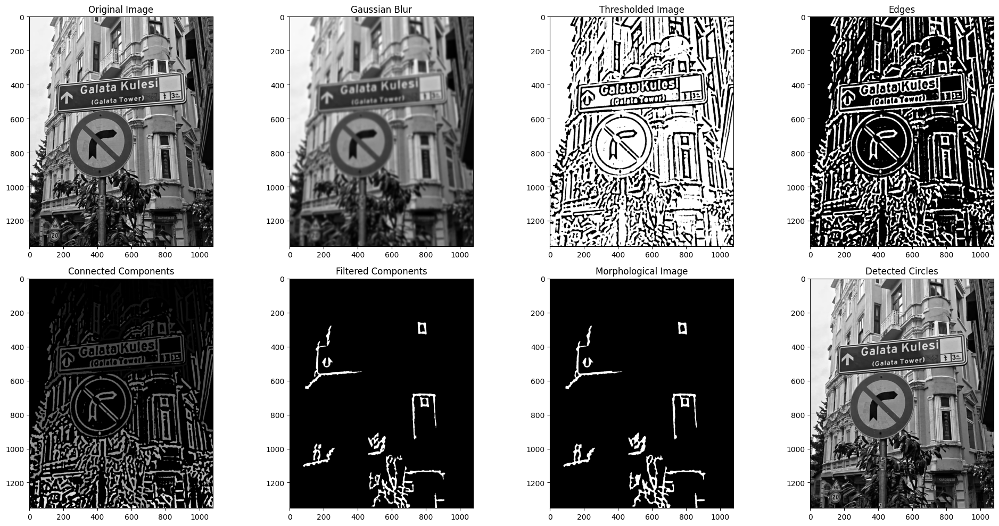

In [27]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


eccentricity 0.8908234873445912
eccentricity 0.8003307397273471
eccentricity 0.4070116533002507
eccentricity 0.6126474461338383
11


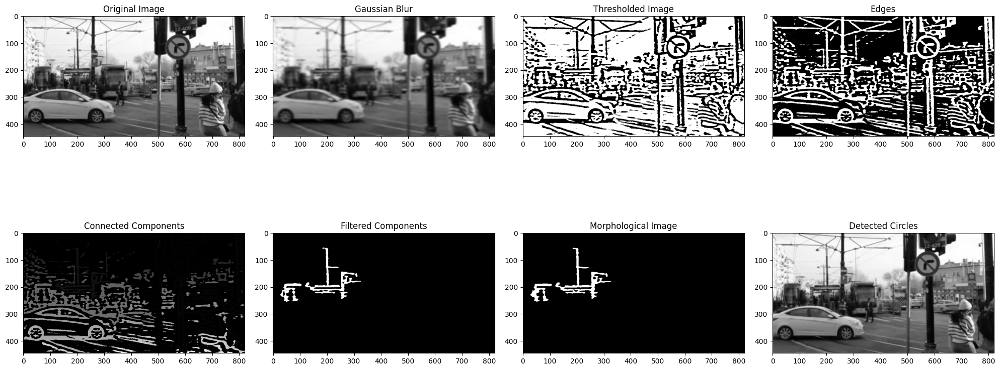

In [28]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_hard_1.png")
detector.visualize_results()

[ WARN:0@830.206] global loadsave.cpp:241 findDecoder imread_('images_gray/train/train_easy_3.png'): can't open/read file: check file path/integrity
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG
libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


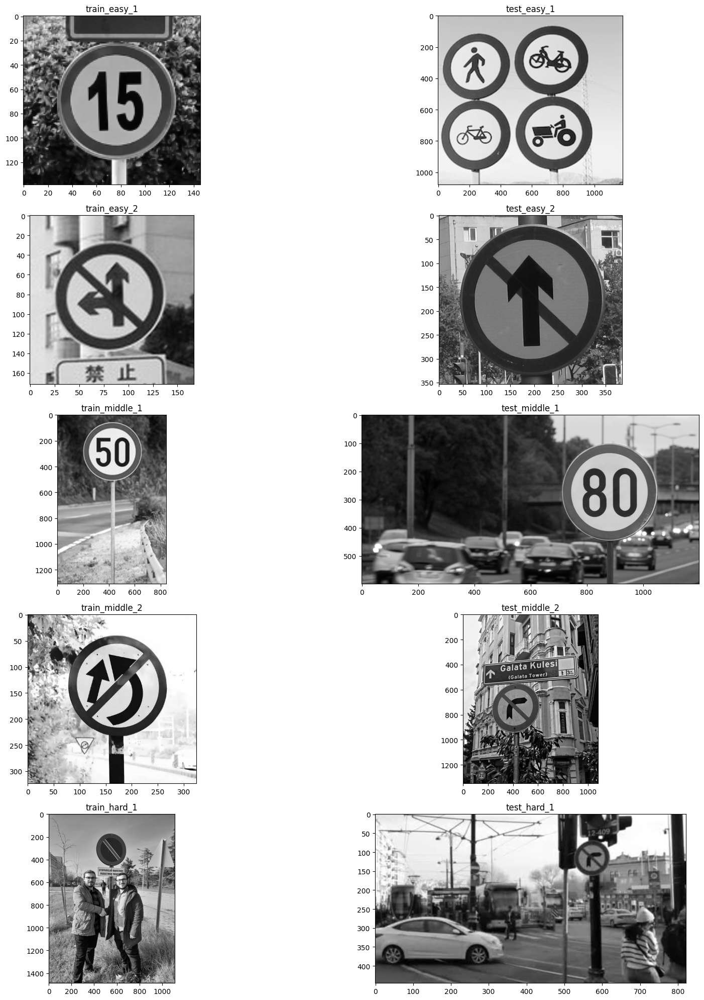

In [29]:
# Define the images and their titles
images = [
    "train_easy_1",
    "test_easy_1",
    "train_easy_2",
    "test_easy_2", 
    "train_middle_1",
    "test_middle_1", 
    "train_middle_2",
    "test_middle_2", 
    "train_hard_1",
    "test_hard_1",
]

# Load all 
train_easy_1_img = cv2.imread("images_gray/train/train_easy_1.png", cv2.IMREAD_GRAYSCALE)
train_easy_3_img = cv2.imread("images_gray/train/train_easy_3.png", cv2.IMREAD_GRAYSCALE)
train_middle_1_img = cv2.imread("images_gray/train/train_middle_1.png", cv2.IMREAD_GRAYSCALE)
train_middle_2_img = cv2.imread("images_gray/train/train_middle_2.png", cv2.IMREAD_GRAYSCALE)
train_hard_1_img = cv2.imread("images_gray/train/train_hard_1.png", cv2.IMREAD_GRAYSCALE)
test_easy_1_img = cv2.imread("images_gray/test/test_easy_1.png", cv2.IMREAD_GRAYSCALE)
test_easy_2_img = cv2.imread("images_gray/test/test_easy_2.png", cv2.IMREAD_GRAYSCALE)
test_middle_1_img = cv2.imread("images_gray/test/test_middle_1.png", cv2.IMREAD_GRAYSCALE)
test_middle_2_img = cv2.imread("images_gray/test/test_middle_2.png", cv2.IMREAD_GRAYSCALE)
test_hard_1_img = cv2.imread("images_gray/test/test_hard_1.png", cv2.IMREAD_GRAYSCALE)

# Plot all images using a for loop
plt.figure(figsize=(20, 20))
for image in images:
    idx = images.index(image) + 1
    title = image
    img = cv2.imread(f"images_gray/train/{image}.png", cv2.IMREAD_GRAYSCALE) if "train" in image \
            else cv2.imread(f"images_gray/test/{image}.png", cv2.IMREAD_GRAYSCALE)
    plt.subplot(5, 2, idx)
    plt.title(title)
    plt.imshow(img, cmap="gray")

plt.tight_layout()
plt.show()
